# **HW2**. Сто бед - одна UNet.

Так как по сегментации у нас нет занятия в курсе, а есть только лекции в онлайн-курсе, в этой домашке будут и некоторые вводные по теме, чтобы вы не чувствовали себя брошенными.

Максимум, который можно получить за это дз - **10 баллов**.

## **0. Введение**

Сегментация разная бывает, инстанс мы немножко видели в лекции по детекции, а семантик будет сейчас.

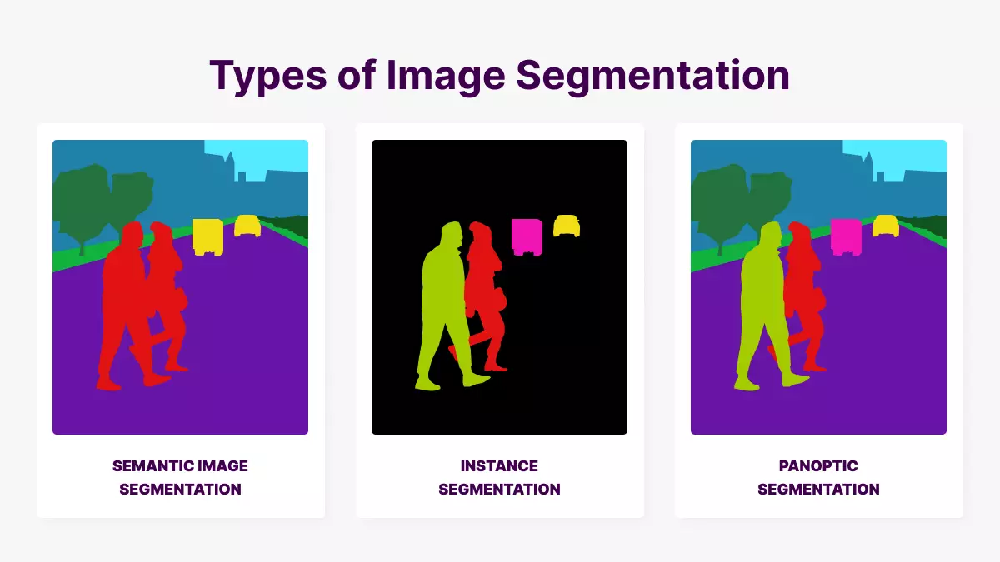

Фактически сегментация - это попиксельная классификация.

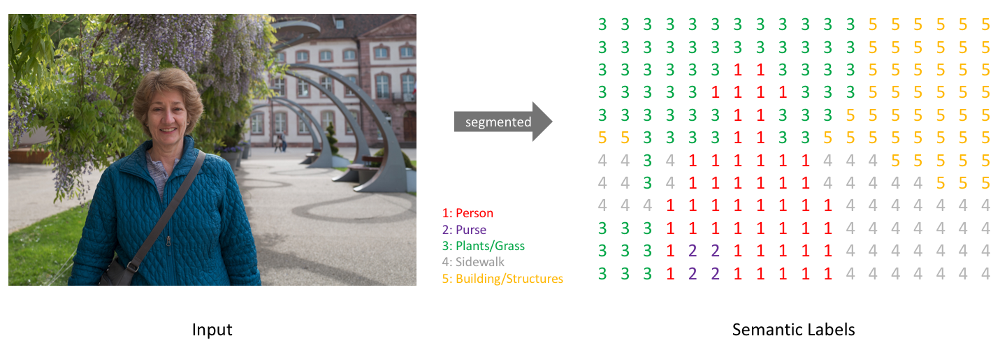

Видео с сегментированными машинками [смотреть тут](https://www.youtube.com/watch?v=ATlcEDSPWXY).

## **1. Подготовь данные**


Будем использовать данные с первого этапа **PicsArt AI Hackathon**. Скачать [тут](https://drive.google.com/file/d/18WuwEMabQVmYB_szumG7PobjuhtpkAVu/view?usp=sharing).
- Загрузим и распакуем данные
- Напишем класс `Dataset` для наших данных
- Посмотрим примеры данных

In [59]:
import os
import cv2

import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import matplotlib.pyplot as plt


import torchvision
import torch.utils.data as data
import torchvision.models as models
import torchvision.transforms as transforms
import albumentations as A
from skimage.color import label2rgb
from albumentations.pytorch import ToTensorV2
from torch.optim.lr_scheduler import CosineAnnealingLR



import PIL
from PIL import Image
from glob import glob
from torch.utils.data import Dataset, DataLoader

import warnings
warnings.filterwarnings('ignore')

### **Задание 1** (2 балла)
Для того, чтобы учить сеть, нужен будет `Dataloader`, а значит и собственный `Dataset`. Чтобы собрать `Dataset`, надо понять как выглядят данные и аннотация, а также какие данные понадобятся вашей сетке для обучения.

Данные уже разделены на `train` и `test`, никакого кровосмешения больше не делаем.

**(1 балл)** Разархивируйте данные, загрузите их и визуализируйте фото и соответствующие им маски (4-5 шт). Посмотрите, как устроены маски. Подумайте, как будут соотноситься transform-ы для картинок и масок.

**(1 балл)** Напишите `FaceDataset`, заведите `transform`(ы), заведите по нему loader-ы для трейна и теста, проверьте что всё ок.

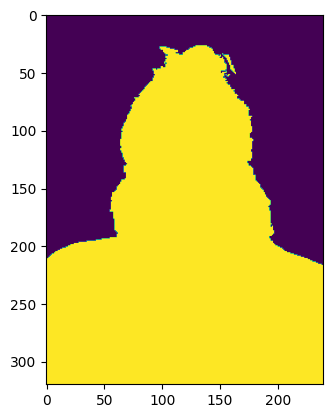

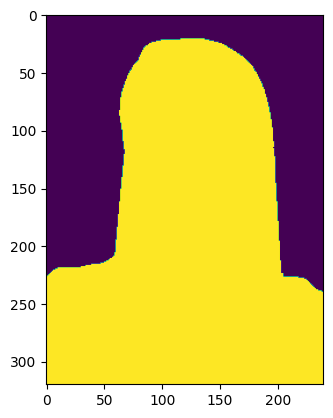

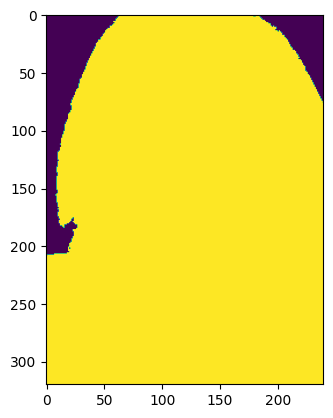

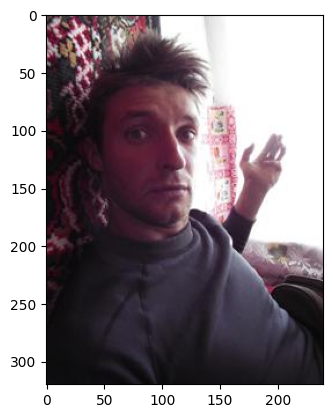

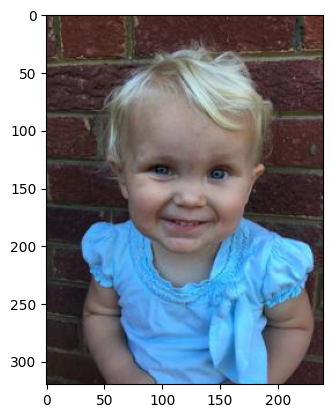

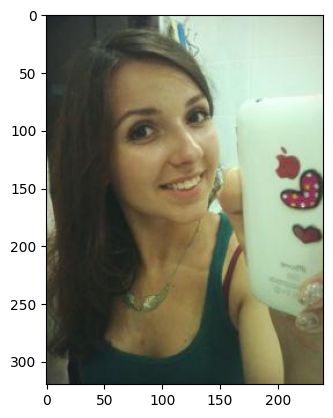

In [60]:
path_train = '/kaggle/input/faces-ds/data/data/train'
path_test = '/kaggle/input/faces-ds/data/data/test'
path_train_mask = '/kaggle/input/faces-ds/data/data/train_mask'
path_test_mask = '/kaggle/input/faces-ds/data/data/test_mask'

for f in os.listdir(path_train_mask)[:3]:
    img = Image.open(os.path.join(path_train_mask, f))
    plt.imshow(img)
    plt.show()

for f in os.listdir(path_train)[:3]:
    img = Image.open(os.path.join(path_train, f))
    plt.imshow(img)
    plt.show()

In [61]:
MAX_SIZE = 1120
height, width, channels = np.array(img).shape
height, width

(320, 240)

### Augmentations

https://www.kaggle.com/code/blondinka/how-to-do-augmentations-for-instance-segmentation

In [64]:
D4_transforms = [A.Resize(224,224), 
                # D4 Group augmentations
                A.HorizontalFlip(p=1),
                A.VerticalFlip(p=0.5),
                A.RandomRotate90(p=0.5),
                A.Transpose(p=0.5),                   
                A.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225]),
                ]

geom_transforms =  [A.Resize(224,224),
                    A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=15, 
                       interpolation=cv2.INTER_LINEAR, border_mode=cv2.BORDER_CONSTANT, value=0, mask_value=0, p=0.5),
                    # D4 Group augmentations
                    A.HorizontalFlip(p=0.5),
                    A.VerticalFlip(p=0.5),
                    A.RandomRotate90(p=0.5),
                    A.Transpose(p=0.5),
                    # crop and resize  
#                     A.RandomSizedCrop((MAX_SIZE-100, MAX_SIZE), height//2, width//2, w2h_ratio=1.0, 
#                                         interpolation=cv2.INTER_LINEAR, always_apply=False, p=0.5),  
#                     A.Resize(height//2, width//2, interpolation=cv2.INTER_LINEAR, p=1), 
                    A.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225]),
                    ]
                 
heavy_transforms = [A.Resize(224,224),
                    A.RandomRotate90(),
                    A.Flip(),
                    A.Transpose(),
                    A.GaussNoise(),
                    A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=45, p=0.7),                    
                    A.OneOf([
                        A.MotionBlur(p=0.2),
                        A.MedianBlur(blur_limit=3, p=0.1),
                        A.Blur(blur_limit=3, p=0.1),
                    ], p=0.5),                    
#                     A.OneOf([                        
#                         A.IAASharpen(),
#                         A.IAAEmboss(),
#                         A.RandomBrightnessContrast(),
#                     ], p=0.5),
                    A.HueSaturationValue(p=0.3),
                    A.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225]),
                    ]

In [65]:
def plot_image_aug(image, image_aug, masks, aug_masks):
    """Helper to plot images with bboxes and masks and their augmented versions 
    Args:
        image, image_aug: image as open-cv numpy array, original and augmented
        masks, aug_masks:setof binary masks, original and augmented 
        bbox, aug_boxes : boxes as a list or numpy array, original and augmented       
    """
    # glue masks together
    one_mask = np.zeros_like(masks[0])
    for i, mask in enumerate(masks):
        one_mask += (mask > 0).astype(np.uint8) * (11-i)       
    
    one_aug_mask = np.zeros_like(aug_masks[0])
    for i, augmask in enumerate(aug_masks):
        one_aug_mask += (augmask > 0).astype(np.uint8) * (11-i) 
    
            # for binary masks we get one channel and need to convert to RGB for visualization
    mask_rgb = label2rgb(one_mask, bg_label=0)            
    mask_aug_rgb = label2rgb(one_aug_mask, bg_label=0) 
    
    f, ax = plt.subplots(2, 2, figsize=(16, 16))             
    ax[0, 0].imshow(img)
    ax[0, 0].set_title('Original image')        
    ax[0, 1].imshow(image_aug)
    ax[0, 1].set_title('Augmented image')     
    ax[1, 0].imshow(mask_rgb, interpolation='nearest')
    ax[1, 0].set_title('Original mask')
    ax[1, 1].imshow(mask_aug_rgb, interpolation='nearest')
    ax[1, 1].set_title('Augmented mask')
    f.tight_layout()
    plt.show() 

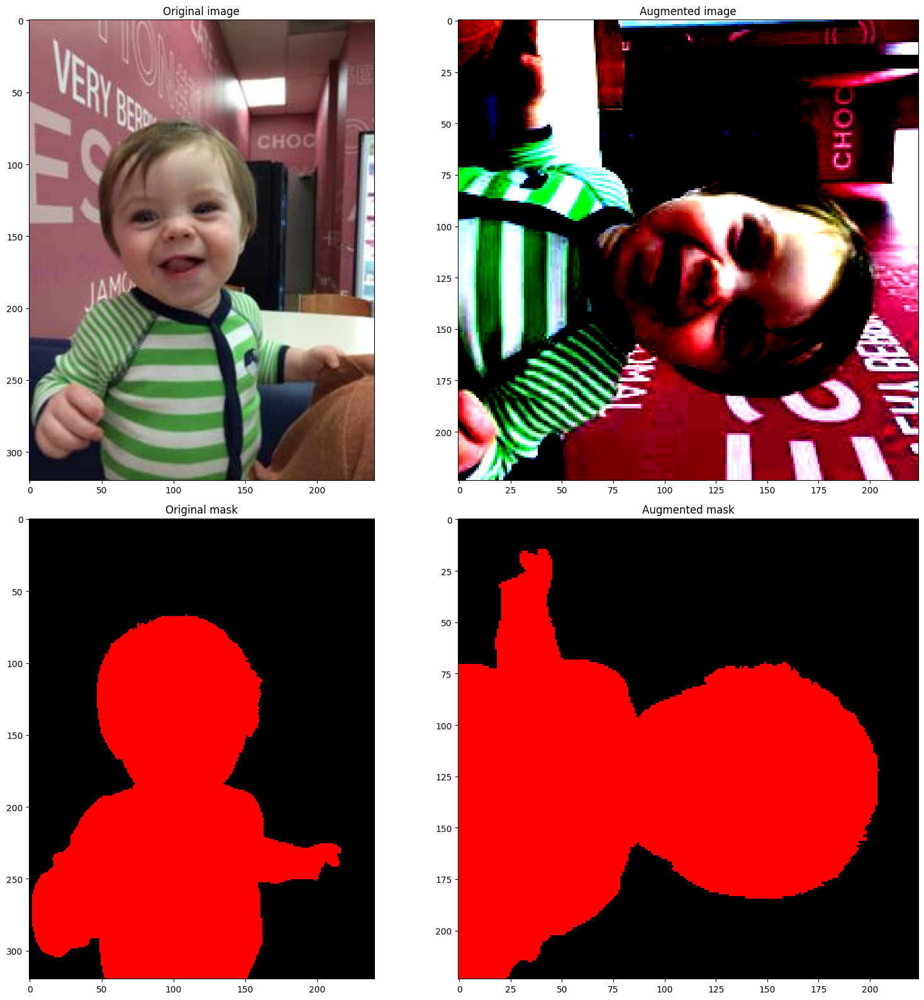

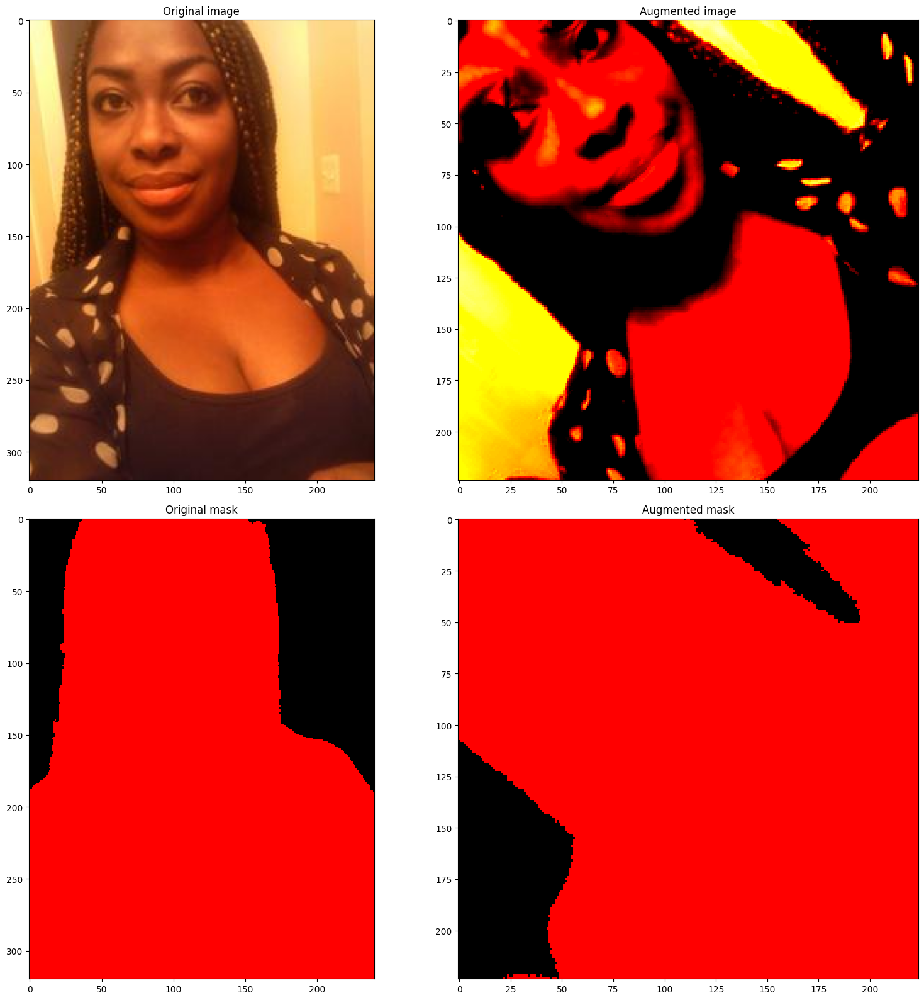

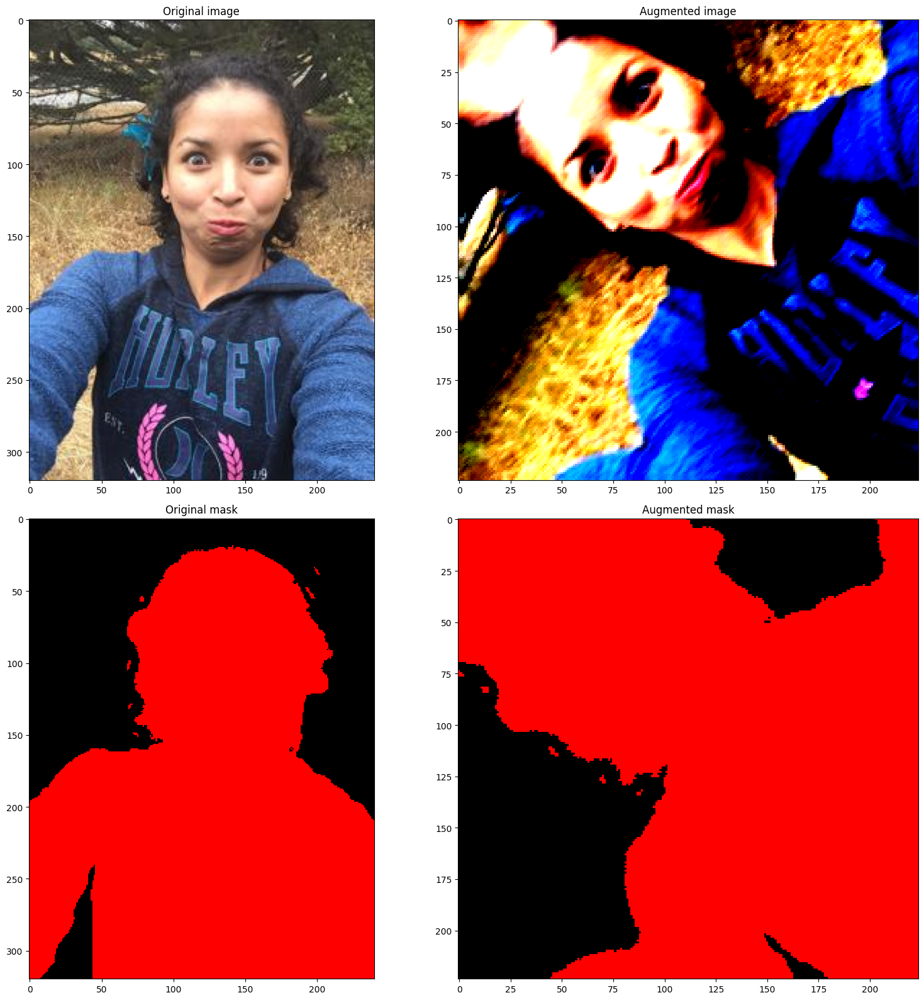

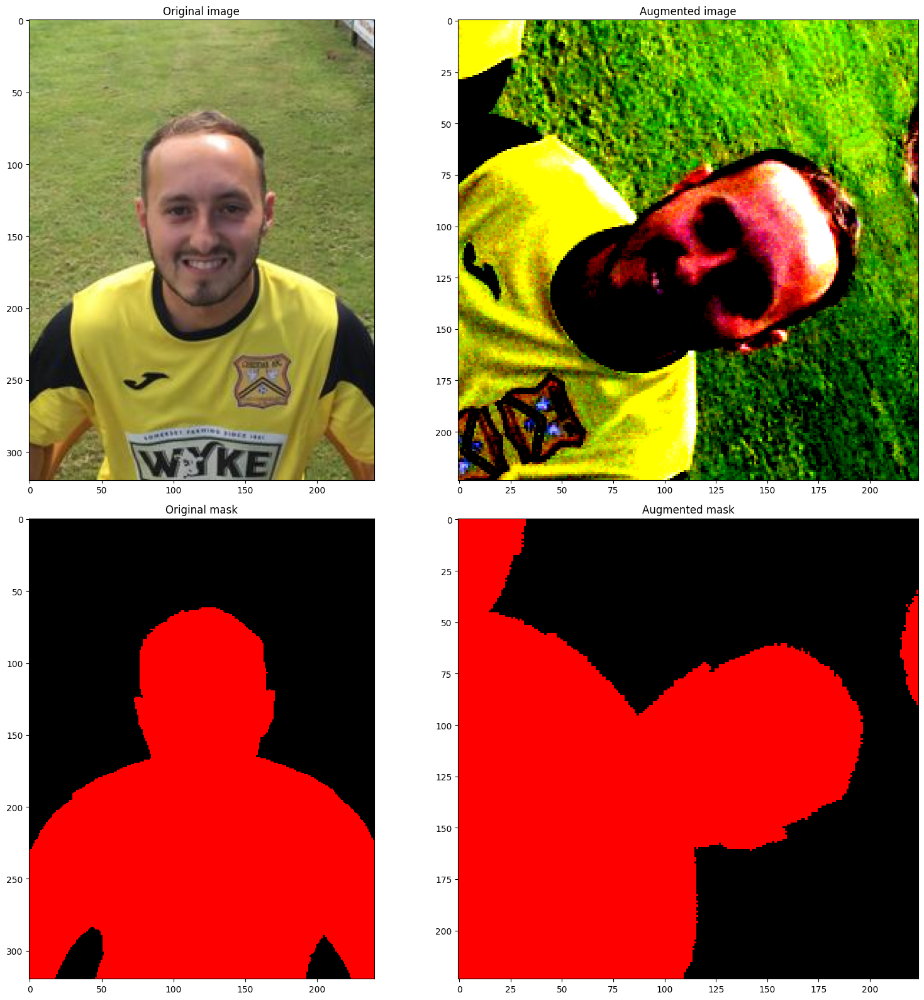

In [66]:
for f in os.listdir(path_test)[1:5]:
        img = np.array(Image.open(os.path.join(path_test, f)))
        img_mask = np.array(Image.open(os.path.join(path_test_mask, f[:5]+'png')))
        augs = A.Compose(heavy_transforms, p=1)       
        augmented = augs(image=img, masks=[img_mask])     
        aug_img = augmented['image']
        aug_masks = augmented['masks']
        plot_image_aug(img, aug_img, [img_mask], aug_masks)

In [67]:
size = 200
D4_transforms = [
                #A.CenterCrop(size,size),
                A.Resize(size, size), 
                # D4 Group augmentations
                A.HorizontalFlip(p=0.5),
                A.VerticalFlip(p=0.5),
                A.RandomRotate90(p=0.5),
                A.Transpose(p=0.5),  
                A.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225]),  
                ToTensorV2(),
                ]

geom_transforms =  [#A.CenterCrop(size,size),
                    A.Resize(size, size),
                    A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=15, 
                       interpolation=cv2.INTER_LINEAR, border_mode=cv2.BORDER_CONSTANT, value=0, mask_value=0, p=0.5),
                    # D4 Group augmentations
                    A.HorizontalFlip(p=0.5),
                    A.VerticalFlip(p=0.5),
                    A.RandomRotate90(p=0.5),
                    A.Transpose(p=0.5),
                    # crop and resize  
#                     A.RandomSizedCrop((MAX_SIZE-100, MAX_SIZE), height//2, width//2, w2h_ratio=1.0, 
#                                         interpolation=cv2.INTER_LINEAR, always_apply=False, p=0.5),  
#                     A.Resize(height//2, width//2, interpolation=cv2.INTER_LINEAR, p=1), 
                    A.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225]),  
                    ToTensorV2(),
                    ]
                 
heavy_transforms = [#A.CenterCrop(size,size),
                    A.Resize(size, size),
                    A.RandomRotate90(),
                    A.Flip(),
                    A.Transpose(),
                    A.GaussNoise(),
                    A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=45, p=0.7),                    
                    A.OneOf([
                        A.MotionBlur(p=0.2),
                        A.MedianBlur(blur_limit=3, p=0.1),
                        A.Blur(blur_limit=3, p=0.1),
                    ], p=0.5),                    
#                     A.OneOf([                        
#                         A.IAASharpen(),
#                         A.IAAEmboss(),
#                         A.RandomBrightnessContrast(),
#                     ], p=0.5),
                    A.HueSaturationValue(p=0.3),
                    A.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225]),  
                    ToTensorV2(),
                    ]
test_transforms = [
                    #A.CenterCrop(size,size),
                    A.Resize(size, size),
                    A.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225]),  
                    ToTensorV2(),
                    ]

In [68]:
class FaceDataset(Dataset):
    def __init__(self, path, transform=None):

        img_paths = [os.path.join(path, f) for f in os.listdir(path)]
        mask_paths = [os.path.join(path + '_mask', f) for f in os.listdir(path + '_mask')]

        self.transform = transform
        self.img_paths = img_paths
        self.mask_paths = mask_paths

    def __getitem__(self, index):

        img_path = self.img_paths[index]
        img = np.array(Image.open(img_path))

        mask_path = self.mask_paths[index]
        img_mask = np.array(Image.open(mask_path))
        augs = A.Compose(self.transform, p=1)       
        augmented = augs(image=img, masks=[img_mask])     
        aug_img = augmented['image']
        aug_mask = augmented['masks']

        return aug_img, aug_mask[0].unsqueeze(0) / 255


    def __len__(self):
        return len(self.img_paths)

In [69]:
train_dataset = FaceDataset(path_train, transform=heavy_transforms)
test_dataset = FaceDataset(path_test, transform=test_transforms)

In [70]:
image, mask = train_dataset[0]

image.shape

torch.Size([3, 200, 200])

In [71]:
# чекаем что размеры консистентны
image.shape, mask.shape

(torch.Size([3, 200, 200]), torch.Size([1, 200, 200]))

https://github.com/datasouls/picsart-online/blob/master/PicsartHack_Baseline.ipynb

## **2. Разберись в U-net**

Как делать можно, но мы так не будем:

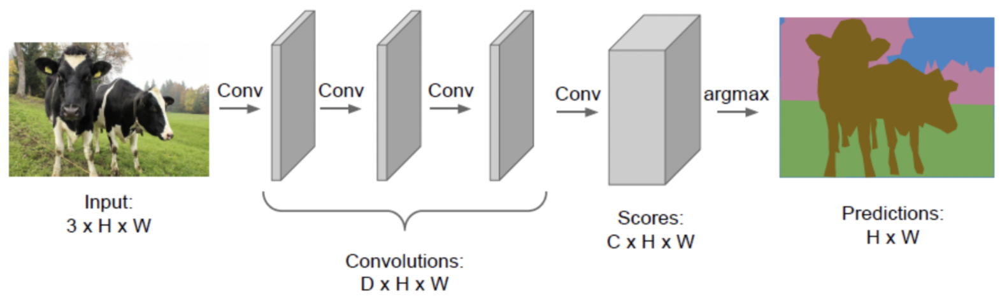

Или так ещё:

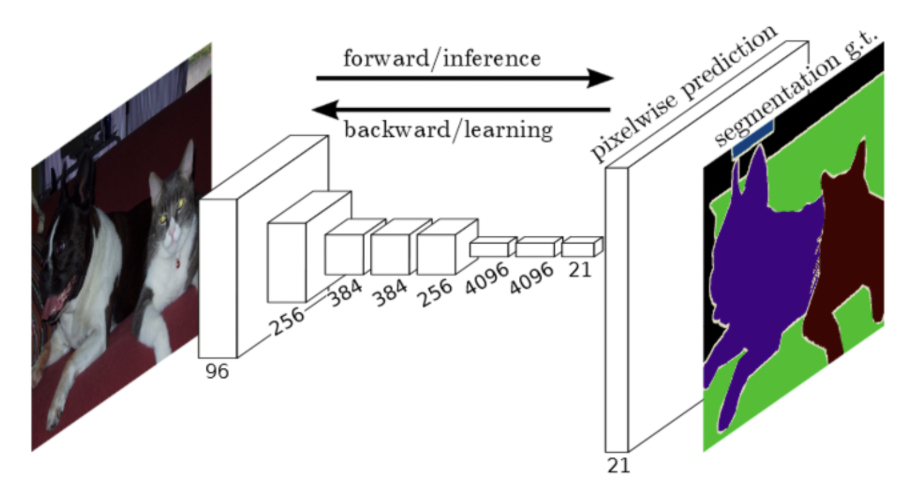

А будем так:

![](https://drive.google.com/uc?export=view&id=1r9oUaZInyoPO9d0pKDt6uOqBgzjZlSy3)

**UNet** - это
- очень сильный бейзлайн для большого спектра задач
- простая идея и реализация

### **Задание 2.** (2 балла)

Пишем энкодер!

Он у нас будет состоять из однообразных блоков, в которых будем только параметризовать количество входных и выходных каналов.

**(1 балл)** Напиши один **блок кодировщика** - он должен состоять из двух последовательных сверток, активаций и опционального батчнорма:

In [72]:
# заведем отдельно себе функцию для светку дальнейшую
def conv3x3(in_channels, out_channels, dilation=1):
    return nn.Conv2d(in_channels, out_channels, 3, padding=dilation, dilation=dilation)

In [73]:
class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, batch_norm=False):
        super().__init__()

        self.batch_norm = batch_norm
        self.conv1 = conv3x3(in_channels, out_channels)

        self.bn = nn.BatchNorm2d(out_channels)

        self.relu1 = nn.ReLU(inplace=True)
        self.conv2 = conv3x3(out_channels, out_channels)
        self.relu2 = nn.ReLU(inplace=True)

    def forward(self, x):
        # свертка
        # опциональный батч норм
        # активация
        # и повторить
        x = self.conv1(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.relu1(x)
        x = self.conv2(x)
        x = self.relu2(x)

        return x

In [74]:
block = EncoderBlock(3, 16)
block

EncoderBlock(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu1): ReLU(inplace=True)
  (conv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu2): ReLU(inplace=True)
)

In [75]:
x = torch.zeros(4, 3, 128, 128)

with torch.no_grad():
    print(block(x).shape)

torch.Size([4, 16, 128, 128])


**(1 балл)** А теперь напишем класс для всего энкодера.

Его конструкция определяется числом входных каналов, количеством фильтров в первом блоке и количеством блоков.

Помним также, что для работы сети нам нужно запоминать промежуточные активации. (Их будем по skip connection-ам ещё кидать).

In [76]:
class Encoder(nn.Module):
    def __init__(self, in_channels, num_filters, num_blocks):
        super().__init__()

        self.num_blocks = num_blocks

        # пройдем по блокам и посчитаем какие в каждом будут in и out channels
        # советую посмотреть на схему архитектуры
        # вход-выход последовательных должны очевидно совпадать
        # а количество выходных должно по степени двойки возрастать
        out_channels = num_filters
        for i in range(num_blocks):
            self.add_module(f'block{i + 1}', EncoderBlock(in_channels, out_channels))
            if i != num_blocks - 1:
                self.add_module(f'pool{i + 1}', nn.MaxPool2d(2, 2))
            in_channels = out_channels
            out_channels *= 2
    def forward(self, x):
        acts = [] # нам некоторые выходы ещё понадобятся, будем их собирать

        for i in range(self.num_blocks):
            x = self.__getattr__(f"block{i+1}")(x) # вызываем блок, берем его результат
            acts.append(x) # кладем результирующую feature map

            if i != self.num_blocks - 1: # если это не последний блок, то дропаем пространственную размерность
                  x = self.__getattr__(f"pool{i+1}")(x)
        return acts

In [77]:
# проверяем что всё ок
encoder = Encoder(in_channels=3, num_filters=16, num_blocks=4)
encoder

Encoder(
  (block1): EncoderBlock(
    (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu2): ReLU(inplace=True)
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (block2): EncoderBlock(
    (conv1): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu2): ReLU(inplace=True)
  )
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (block3): EncoderBlock(
    (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn): BatchNorm2d(64, eps=1

In [78]:
# проверяем что всё ок
x = torch.zeros(4, 3, 512, 512)

[_.shape for _ in encoder(x)]

[torch.Size([4, 16, 512, 512]),
 torch.Size([4, 32, 256, 256]),
 torch.Size([4, 64, 128, 128]),
 torch.Size([4, 128, 64, 64])]

### **Задание 3.** (2 балла)

Пишем декодер!

Блок декодера состоит из `transposed convolutions` c учетом `skip connections`: апскейлинга входа "снизу" + свертки, конкатенации `feature map` с одного уровня энкодера и декодера и их совместное сворачивание.

Есть несколько способов повысить разрешение тензора - например это разные типы интерполяции: `nearest neighbour`, `bilinear`, `bicubic`.

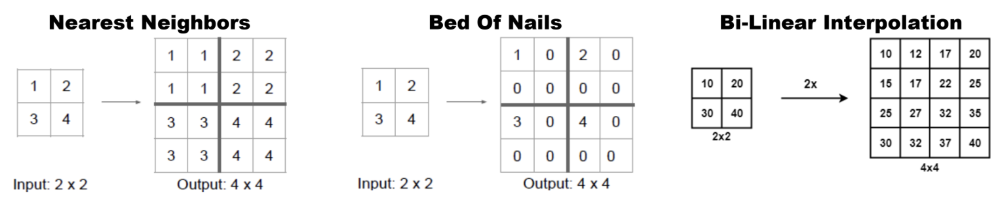

![](https://drive.google.com/uc?export=view&id=1Sazg6ZRQmw8xrJg4-MMccO0S_ib3kjvn)

В `pytorch` это можно делать с помощью модуля: [`nn.Upsample`](https://pytorch.org/docs/stable/generated/torch.nn.Upsample.html) + `nn.conv2d`, а можно использовать сразу [`nn.ConvTranspose2d`](https://pytorch.org/docs/stable/generated/torch.nn.ConvTranspose2d.html).

В типичном репозитории `UNet` например есть [опция](https://github.com/milesial/Pytorch-UNet/blob/8f317cb13c17ef25a86b25a0c24390e04cd4db82/unet/unet_parts.py#L50) что делать.


**(1 балл)** Напиши блок декодера.

In [79]:
class DecoderBlock(nn.Module):
    def __init__(self, out_channels):
        super().__init__()

#         self.uppool = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
#         self.upconv = torch.nn.Conv2d(in_channels=out_channels * 2, out_channels=out_channels,kernel_size=3, padding=1, dilation=1)
        self.upsample = nn.ConvTranspose2d(2 * out_channels, out_channels, kernel_size=3, padding=1, dilation=1)
        self.conv1 = conv3x3(2 * out_channels, out_channels)
        self.conv2 = conv3x3(out_channels, out_channels)

    def forward(self, down, left):
#         x = self.uppool(down)
#         x = self.upconv(x)
        x = self.upsample(down)
        diffY = left.size()[2] - x.size()[2]
        diffX = left.size()[3] - x.size()[3]

        x = F.pad(x, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        x = torch.cat([x, left], dim=1)
        x = self.conv1(x)
        x = self.conv2(x)
        return x

**(1 балл)** Собери весь декодер из блочков.

In [80]:
class Decoder(nn.Module):
    def __init__(self, num_filters, num_blocks):
        super().__init__()

        # собираем блоки в обратном порядке
        out_channels = num_filters
        for i in range(num_blocks):
            self.add_module(f'block{num_blocks - i}', DecoderBlock(out_channels))
            out_channels = out_channels * 2
    def forward(self, acts):
        up = acts[-1] # сперва берем последнюю в списке фичемапу как есть

        # далее начинаем их конкатенировать и прогонять через блоки
        for i, left in enumerate(acts[-2::-1]):
            up = self.__getattr__(f'block{i + 1}')(up, left)
        return up

In [81]:
[_.shape for _ in encoder(x)]

[torch.Size([4, 16, 512, 512]),
 torch.Size([4, 32, 256, 256]),
 torch.Size([4, 64, 128, 128]),
 torch.Size([4, 128, 64, 64])]

In [82]:
# проверяем что всё ок
decoder = Decoder(16, 3)
decoder

Decoder(
  (block3): DecoderBlock(
    (upsample): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv1): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (block2): DecoderBlock(
    (upsample): ConvTranspose2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv1): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (block1): DecoderBlock(
    (upsample): ConvTranspose2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv1): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
)

In [83]:
# проверяем что всё ок
decoder(encoder(x)).shape

torch.Size([4, 16, 512, 512])

`U-Net` состоит из такого кодировщика и декодировщика, а также финального слоя классификации:

In [84]:
class UNet(nn.Module):
    def __init__(self, num_classes, in_channels=3, num_filters=64, num_blocks=4):
        super().__init__()

        self.encoder = Encoder(in_channels, num_filters, num_blocks)
        self.decoder = Decoder(num_filters, num_blocks-1)
        self.final = nn.Conv2d(num_filters, num_classes, 1)

    def forward(self, x):
        acts = self.encoder(x)
        x = self.decoder(acts)
        x = self.final(x)
        return x

In [85]:
model = UNet(num_classes=1)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

UNet(
  (encoder): Encoder(
    (block1): EncoderBlock(
      (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu1): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu2): ReLU(inplace=True)
    )
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (block2): EncoderBlock(
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu1): ReLU(inplace=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu2): ReLU(inplace=True)
    )
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (block3): EncoderBlock(
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), s

In [86]:
# проверяем что всё ок
images = torch.randn(4, 3, 416, 416).to(device)

model(images).shape

torch.Size([4, 1, 416, 416])

## **3. Обучи сеть**



Ну а теперь будем учить.

### Вспомогательные функции

In [87]:
# функция для обучения, используй на свое усмотрение
def train_epoch(model, optimizer, train_loader, criterion, device):
    model.train()

    for batch_train, batch_answers in train_loader:
        batch_train = batch_train.to(device)
        batch_answers = batch_answers.to(device)

        optimizer.zero_grad()

        model_answers = model(batch_train)
        
        new_loss = criterion(model_answers, batch_answers)
        model_mask = model_answers > th
        one_batch_dice = float(dice_score(model_mask.cpu().numpy(), batch_answers.cpu().numpy()))
        new_loss.backward()
        optimizer.step()

Какую метрику использовать для оценки качества сегментации?
Можно IoU, а можно Dice.

В целом он очень близок к IoU, но в знаменателе полная сумма, а не объединение (поэтому числитель и удвоен, тк в знаменателе он тоже дважды учитывается).

А крут он тем, что из него можно сделать дифференцируемую функцию и свести задачу сразу к оптимизации целевой метрики.

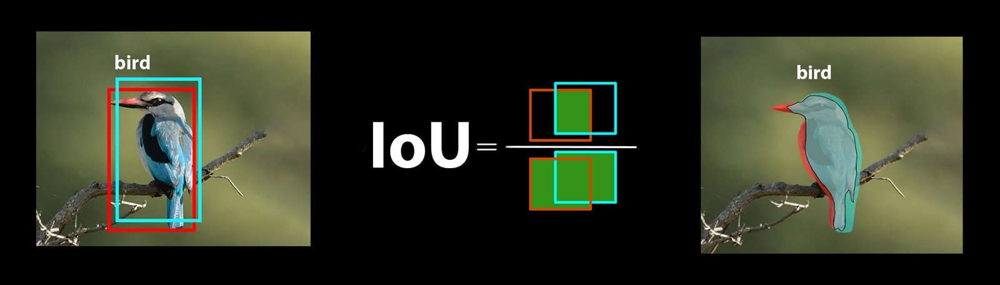

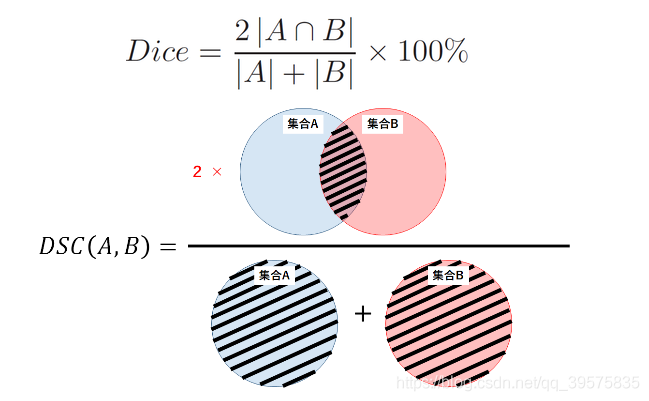

In [88]:
def dice_score(pred_mask, true_mask):
    smooth = 1e-10
    true_mask = true_mask.astype(bool)
    pred_mask = pred_mask.astype(bool)

    intersection = (true_mask & pred_mask).sum()
    im_sum = true_mask.sum() + pred_mask.sum()

    return 2. * intersection / (im_sum + smooth)

In [89]:
# функция для тестирования, меняй по своему усмотрению
def evaluate_loss(loader, model, criterion, th, device):
    model.eval()

    total_loss = 0
    total_dice = 0
    total_n = 0

    with torch.no_grad():
        for batch_test, batch_answers in loader:
            batch_test = batch_test.to(device)
            batch_answers = batch_answers.to(device)

            model_answers = torch.sigmoid(model(batch_test))
            one_batch_loss = float(criterion(model_answers, batch_answers))

            # отсекаем неуверенные точки маски, по уверенным считаем dice
            model_mask = model_answers > th
            one_batch_dice = float(dice_score(model_mask.cpu().numpy(), batch_answers.cpu().numpy()))

            total_loss += one_batch_loss
            total_dice += one_batch_dice
            total_n += 1

    return (total_loss / total_n, total_dice / total_n)

### **Задание 4**. (2 балла)

А теперь эксперимент.

**(1 балл)** Собери все части вместе, обучи сетку, отрисуй свои результаты

**(1 балл)** Получи avg test dice score = 0.9.

https://github.com/qubvel/segmentation_models.pytorch.git

In [96]:
# создаем лоадеры для данных
batch_size = 64
num_gpus = torch.cuda.device_count()

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2 * num_gpus, pin_memory=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, num_workers=2 * num_gpus, pin_memory=True)

In [97]:
# готовим всё важное: модель, оптимайзер, лосс
model = UNet(num_classes=1, num_blocks=4)
lr, weight_decay, epochs = 1e-3, 1e-3, 20
# optimizer = optim.RMSprop(model.parameters())#, lr=lr, weight_decay=1e-8, momentum=0.9)
optimizer = torch.optim.Adam(params=model.parameters())#, lr=lr)#, weight_decay=weight_decay)
# optimizer = torch.optim.SGD(model.parameters(), lr=lr)#
#                             momentum=0.9, weight_decay=weight_decay)
criterion = nn.BCEWithLogitsLoss()
model = model.to(device)
th = 0.65  # порог на скор предсказанной маски

In [98]:
# main loop!

for epoch in range(1, epochs):
    train_epoch(model, optimizer, train_loader, criterion, device=device)
    train_loss, train_dice = evaluate_loss(train_loader, model, criterion, th=th, device=device)
    test_loss, test_dice = evaluate_loss(test_loader, model, criterion, th=th, device=device)

    preds = torch.sigmoid(model(images.to(device))).cpu().detach()
    print(f'Epoch {epoch}: avg train loss {train_loss:.04f}, avg train dice score {train_dice:.04f}')
    print(f'Avg test loss {test_loss:.04f}, avg test dice score {test_dice:.04f}')
    print('________________')

Epoch 1: avg train loss 0.6599, avg train dice score 0.5333
Avg test loss 0.6821, avg test dice score 0.5322
________________
Epoch 2: avg train loss 0.6587, avg train dice score 0.5138
Avg test loss 0.6812, avg test dice score 0.5136
________________
Epoch 3: avg train loss 0.6562, avg train dice score 0.5343
Avg test loss 0.6796, avg test dice score 0.5331
________________
Epoch 4: avg train loss 0.6572, avg train dice score 0.5220
Avg test loss 0.6785, avg test dice score 0.5248
________________
Epoch 5: avg train loss 0.6568, avg train dice score 0.5107
Avg test loss 0.6782, avg test dice score 0.5131
________________
Epoch 6: avg train loss 0.6550, avg train dice score 0.5315
Avg test loss 0.6767, avg test dice score 0.5327
________________
Epoch 7: avg train loss 0.6557, avg train dice score 0.5395
Avg test loss 0.6772, avg test dice score 0.5462
________________
Epoch 8: avg train loss 0.6547, avg train dice score 0.6109
Avg test loss 0.6777, avg test dice score 0.6095
_________

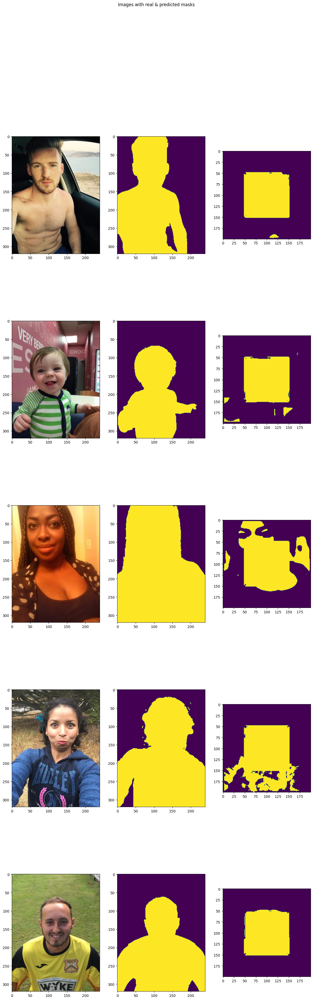

In [100]:
# отрисуй несколько картинок из теста, их gt маски и предсказания
fig, ax = plt.subplots(5, 3, figsize=(15, 45))
fig.suptitle('Images with real & predicted masks')
i = 0
for f in os.listdir(path_test)[:5]:
        img = np.array(Image.open(os.path.join(path_test, f)))
        img_mask = Image.open(os.path.join(path_test_mask, f[:5]+'png'))
        
        with torch.no_grad():
            augs = A.Compose(test_transforms, p=1)
            test_img = augs(image=img)['image'].unsqueeze(0).to(device)
            model_answer = torch.sigmoid(model(test_img))
            img_pred_mask = model_answer[0, 0] > th
            ax[i, 0].imshow(img)
            ax[i, 1].imshow(img_mask)
            ax[i, 2].imshow(img_pred_mask.cpu().numpy().astype(int))
            i += 1

## **4. Сделай лучше**

### **Задание 5**. (2 балла)

Мы уже молодцы, но можно лучше. Осталась последняя часть - получить на тесте реально хорошие метрики.

**(1 балл)** Получи avg test dice score = 0.93.

**(1 балл)** Получи avg test dice score = 0.96.

**Во что потыкать при обучении:**
- Количество блоков
- Использовать **Dice Loss** для обучения
- Аугментации, препроцессинг
- Модифицировать исходные маски (например, убрать артефакты на границе с помощью фильтра)
- Постпроцессинг (порог для маски, постобработка маски - например, заполнить дыры)
- Во всё, что мы обсуждали по трюкам на занятии 2

In [101]:
# готовим всё важное: модель, оптимайзер, лосс
model = UNet(num_classes=1, num_blocks=4)
lr, weight_decay, epochs = 1e-3, 1e-3, 10
# optimizer = optim.RMSprop(model.parameters())#, lr=lr, weight_decay=1e-8, momentum=0.9)
optimizer = torch.optim.Adam(params=model.parameters())#, lr=lr)#, weight_decay=weight_decay)
# optimizer = torch.optim.SGD(model.parameters(), lr=lr)#
#                             momentum=0.9, weight_decay=weight_decay)
criterion = nn.BCEWithLogitsLoss()
model = model.to(device)
th = 0.65  # порог на скор предсказанной маски

In [102]:
# вот эту версию можно использовать в качестве loss-а
def dice_loss(pred_tensor, target_tensor):
    smooth = 1.

    iflat = pred_tensor.contiguous().view(-1)
    tflat = target_tensor.contiguous().view(-1)
    intersection = (iflat * tflat).sum()

    A_sum = torch.sum(iflat)
    B_sum = torch.sum(tflat)

    return 1 - ((2. * intersection + smooth) / (A_sum + B_sum + smooth))

In [103]:
def dice_loss2(inputs, targets):        
        inputs = F.sigmoid(inputs)       
        smooth=1e-6
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        
        return 1 - dice

In [104]:
# функция для тестирования, меняй по своему усмотрению
def evaluate_loss(loader, model, th, device):
    model.eval()

    total_loss = 0
    total_dice = 0
    total_n = 0

    with torch.no_grad():
        for batch_test, batch_answers in loader:
            batch_test = batch_test.to(device)
            batch_answers = batch_answers.to(device)

            model_answers = torch.sigmoid(model(batch_test))
            one_batch_loss = float(dice_loss(model_answers, batch_answers))

            # отсекаем неуверенные точки маски, по уверенным считаем dice
            model_mask = model_answers > th
            one_batch_dice = float(dice_score(model_mask.cpu().numpy(), batch_answers.cpu().numpy()))

            total_loss += one_batch_loss
            total_dice += one_batch_dice
            total_n += 1

    return (total_loss / total_n, total_dice / total_n)

In [105]:
def train_epoch(model, optimizer, train_loader, device):
    model.train()

    for batch_train, batch_answers in train_loader:
        batch_train = batch_train.to(device)
        batch_answers = batch_answers.to(device)

        optimizer.zero_grad()

        model_answers = model(batch_train)
        
        new_loss = dice_loss(model_answers, batch_answers)
        new_loss.backward()
        optimizer.step()

In [106]:
# main loop!

for epoch in range(1, epochs):
    train_epoch(model, optimizer, train_loader, device=device)
    train_loss, train_dice = evaluate_loss(train_loader, model, th=th, device=device)
    test_loss, test_dice = evaluate_loss(test_loader, model, th=th, device=device)

    preds = torch.sigmoid(model(images.to(device))).cpu().detach()
    print(f'Epoch {epoch}: avg train loss {train_loss:.04f}, avg train dice score {train_dice:.04f}')
    print(f'Avg test loss {test_loss:.04f}, avg test dice score {test_dice:.04f}')
    print('________________')

Epoch 1: avg train loss 0.2517, avg train dice score 0.7483
Avg test loss 0.2811, avg test dice score 0.7189
________________
Epoch 2: avg train loss 0.2869, avg train dice score 0.7131
Avg test loss 0.3159, avg test dice score 0.6841
________________
Epoch 3: avg train loss 0.2895, avg train dice score 0.7105
Avg test loss 0.3185, avg test dice score 0.6815
________________
Epoch 4: avg train loss 0.2937, avg train dice score 0.7063
Avg test loss 0.3232, avg test dice score 0.6768
________________
Epoch 5: avg train loss 0.3172, avg train dice score 0.6828
Avg test loss 0.3463, avg test dice score 0.6537
________________
Epoch 6: avg train loss 0.3183, avg train dice score 0.6817
Avg test loss 0.3468, avg test dice score 0.6532
________________
Epoch 7: avg train loss 0.2517, avg train dice score 0.7483
Avg test loss 0.2811, avg test dice score 0.7189
________________
Epoch 8: avg train loss 0.2516, avg train dice score 0.7484
Avg test loss 0.2812, avg test dice score 0.7188
_________

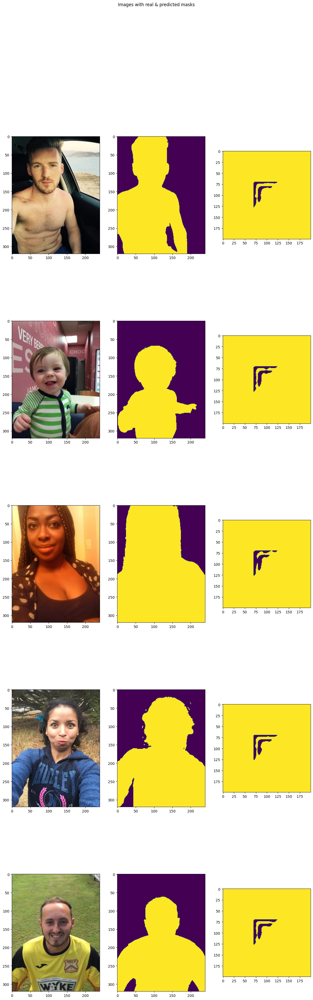

In [108]:
# отрисуй несколько картинок из теста, их gt маски и предсказания
fig, ax = plt.subplots(5, 3, figsize=(15, 45))
fig.suptitle('Images with real & predicted masks')
i = 0
for f in os.listdir(path_test)[:5]:
        img = np.array(Image.open(os.path.join(path_test, f)))
        img_mask = Image.open(os.path.join(path_test_mask, f[:5]+'png'))
        
        with torch.no_grad():
            augs = A.Compose(test_transforms, p=1)
            test_img = augs(image=img)['image'].unsqueeze(0).to(device)
            model_answer = model(test_img)
            img_pred_mask = model_answer[0, 0] > th
            ax[i, 0].imshow(img)
            ax[i, 1].imshow(img_mask)
            ax[i, 2].imshow(img_pred_mask.cpu().numpy().astype(int))
            i += 1

### **GL, HF!**

Спасибо за проверку ДЗ)

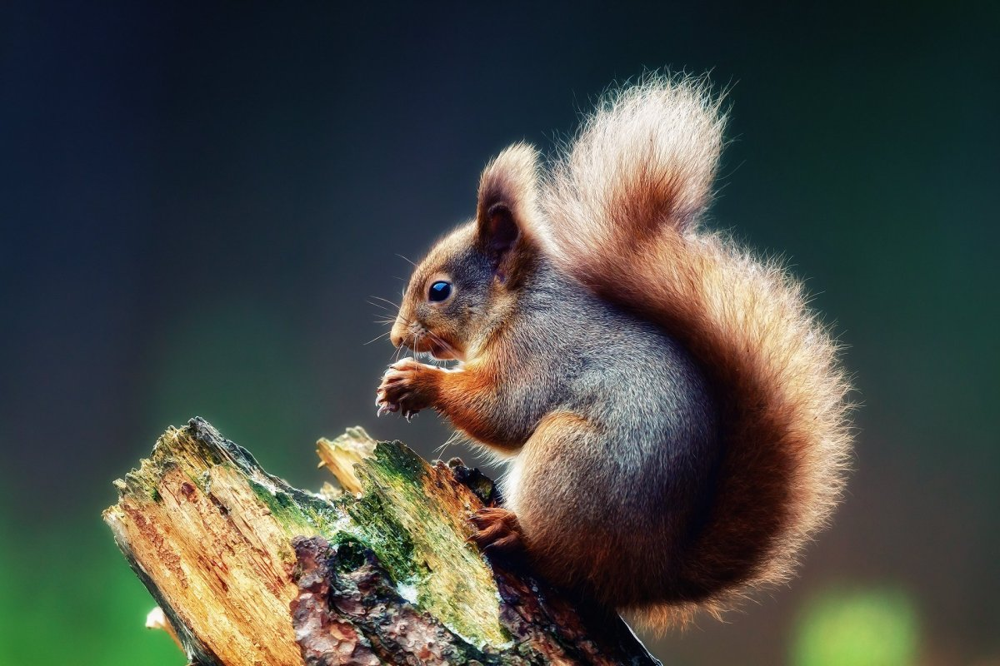